In [1]:
import os
import sys
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly
import plotly.graph_objs as go
import cufflinks as cf
cf.set_config_file(offline=True)

In [2]:
base_path = os.path.abspath('../..')
data_path = os.path.join(base_path, 'data')
database_path = os.path.join(data_path, 'database')
strategy_path = os.path.join(base_path, 'strategy')
check_path = os.path.join(strategy_path, 'check')
sys.path.append(strategy_path)

In [3]:
from strategy import CommodityStrategy, EquityStrategy, IRStrategy, EmergingStrategy
from tester import Tester

In [4]:
from CPM import CPM
from CVA import CVA
from CVA2 import CVA2
from CSS import CSS
from CVO import CVO
from CCA3 import CCA3
from CVA3 import CVA3

In [5]:
cindex_path = os.path.join(data_path, 'fut1return-com.CSV')
cindex2_path = os.path.join(data_path, 'BCOM.csv')

cindex = pd.read_csv(cindex_path, header=0, index_col=0, parse_dates=True)
cindex2 = pd.read_csv(cindex2_path, header=0, index_col=0, parse_dates=True)

CRet = cindex.pct_change(1).iloc[1:]
CRet2 = cindex2.pct_change(1).iloc[1:]
Cindex = (1. + CRet).cumprod()
Cindex = Cindex / Cindex.iloc[0]

start_date = '2001-01-01'
end_date = '2018-05-09'

### 데이터 비교

In [6]:
cpm = CPM(strategy_name="CPM", asset_type="COMMODITY")
cpm.load_index_and_return(from_db=True, save_file=True)

2020-01-22 08:59:43,790 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-22 08:59:43,792 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-22 08:59:43,793 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-22 08:59:43,802 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-22 08:59:51,635 - CPM - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT


In [8]:
r_data = (1.+ CRet.loc[start_date:end_date]).cumprod()
db_data = (1.+ cpm.ret.loc[start_date:end_date]).cumprod()

for column in Cindex.columns:
    toplot = r_data[column].to_frame()
    toplot['DB'] = db_data[column]
    toplot['DIFF'] = toplot[column] - toplot['DB']
    toplot.plot(figsize=(15,10), secondary_y='DIFF')

KeyError: 'CL'

# 1. CPM

In [8]:
cpm = CPM(strategy_name="CPM", asset_type="COMMODITY")
cpm.load_index_and_return(from_db=True, save_file=True)
cpm.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6 
cpm.calculate_signal(CS=0.35, minobs=52, longlen=52, shortlen=17)
cpm.set_portfolio_parameter(cs_strategy_type='vol')
cpm.make_portfolio()

2020-01-21 10:02:07,214 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-21 10:02:07,214 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-21 10:02:07,215 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-21 10:02:07,215 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-21 10:02:07,216 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:02:07,216 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:02:07,217 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:02:07,217 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:02:17,860 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:02:17,860 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:02:27,098 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:02:27,098 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:03:07,765 - CPM - INFO - [STEP 1 - 4] SAVE RETURN DATA I

In [9]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cpm_comp_df = pd.read_csv('./past/cpm.csv', header=0, index_col=0, parse_dates=True)
cpm_lag_comp_df = pd.read_csv('./past/cpm_lag.csv', header=0, index_col=0, parse_dates=True)

In [10]:
tester = Tester(cpm)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:04:30,752 - CPM - INFO - [STEP 6] START BACKTEST
2020-01-21 10:04:30,752 - CPM - INFO - [STEP 6] START BACKTEST
2020-01-21 10:04:30,753 - CPM - INFO - [STEP 6 - 1] BACKTEST CPM TIME SERIES
2020-01-21 10:04:30,753 - CPM - INFO - [STEP 6 - 1] BACKTEST CPM TIME SERIES


CPM
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:04:39,298 - CPM - INFO - [STEP 6 - 2] BACKTEST CPM CROSS SECTIONAL
2020-01-21 10:04:39,298 - CPM - INFO - [STEP 6 - 2] BACKTEST CPM CROSS SECTIONAL


CPM
0% [############################# ] 100% | ETA: 00:00:00

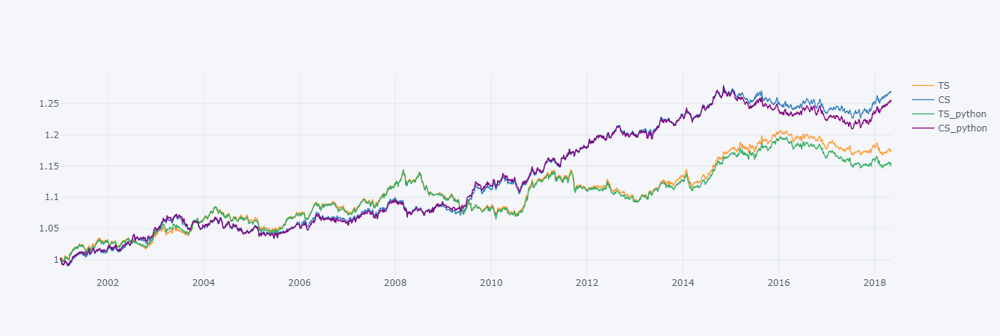

In [11]:
to_plot = (1.+ cpm_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

In [12]:
cindex_path = os.path.join(data_path, 'fut1return-com.CSV')
cindex2_path = os.path.join(data_path, 'BCOM.csv')

cindex = pd.read_csv(cindex_path, header=0, index_col=0, parse_dates=True)
cindex2 = pd.read_csv(cindex2_path, header=0, index_col=0, parse_dates=True)

CRet = cindex.pct_change(1).iloc[1:]
CRet2 = cindex2.pct_change(1).iloc[1:]
Cindex = (1. + CRet).cumprod()
Cindex = Cindex / Cindex.iloc[0]

start_date = '2001-01-01'
end_date = '2018-05-09'

# 2. CVA

In [13]:
cva = CVA(strategy_name="CVA", asset_type="COMMODITY")
cva.load_index_and_return(from_db=True, save_file=True)
cva.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cva.calculate_signal(CS=0.35, nopos=0.6, lookback_period=63)
cva.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva.make_portfolio()

2020-01-21 10:04:48,720 - CVA - INFO - [STEP 0] START LOGGING CVA
2020-01-21 10:04:48,722 - CVA - INFO - [STEP 1] LOAD DATA
2020-01-21 10:04:48,722 - CVA - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:04:48,723 - CVA - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:04:57,639 - CVA - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:05:05,397 - CVA - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:05:43,742 - CVA - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:05:44,129 - CVA - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:05:44,129 - CVA - INFO - [STEP 3] CACULATE SIGNAL
2020-01-21 10:05:44,130 - CVA - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-21 10:05:46,244 - CVA - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA.py:94: FutureWarning:


Passing list-likes to .loc or [] with

In [14]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva_comp_df = pd.read_csv('./past/cva.csv', header=0, index_col=0, parse_dates=True)
cva_lag_comp_df = pd.read_csv('./past/cva_lag.csv', header=0, index_col=0, parse_dates=True)

In [15]:
tester = Tester(cva)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:07:10,692 - CVA - INFO - [STEP 6] START BACKTEST
2020-01-21 10:07:10,692 - CVA - INFO - [STEP 6 - 1] BACKTEST CVA TIME SERIES


CVA
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:07:15,612 - CVA - INFO - [STEP 6 - 2] BACKTEST CVA CROSS SECTIONAL


CVA
0% [############################# ] 100% | ETA: 00:00:00

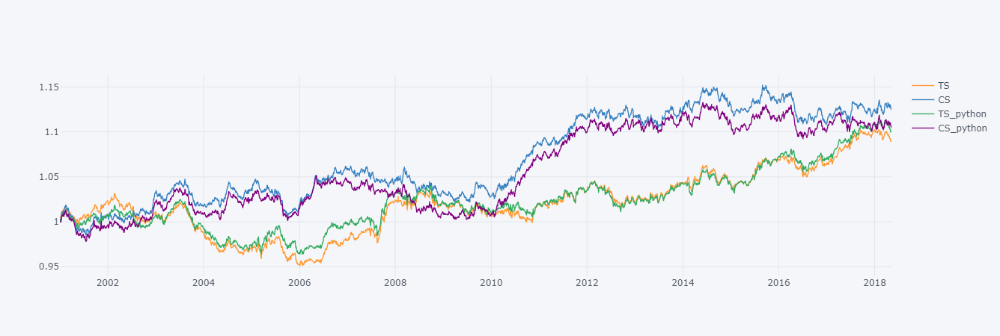

In [16]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 3. CVO

In [17]:
cvo = CVO(strategy_name="CVO", asset_type="COMMODITY")
cvo.load_index_and_return(from_db=True, save_file=True)
cvo.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cvo.calculate_signal(CS=0.35, nopos=0.4, minobs=52)
cvo.set_portfolio_parameter(cs_strategy_type='vol')
cvo.make_portfolio()

2020-01-21 10:07:23,202 - CVO - INFO - [STEP 0] START LOGGING CVO
2020-01-21 10:07:23,203 - CVO - INFO - [STEP 1] LOAD DATA
2020-01-21 10:07:23,203 - CVO - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:07:23,204 - CVO - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:07:32,990 - CVO - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:07:43,868 - CVO - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:08:25,377 - CVO - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:08:25,734 - CVO - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:08:25,735 - CVO - INFO - [STEP 3] CACULATE SIGNAL
2020-01-21 10:08:25,735 - CVO - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-21 10:08:28,052 - CVO - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVO.py:94: FutureWarning:


Passing list-likes to .loc or [] with

In [18]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cvo_comp_df = pd.read_csv('./past/cvo.csv', header=0, index_col=0, parse_dates=True)
cvo_lag_comp_df = pd.read_csv('./past/cvo_lag.csv', header=0, index_col=0, parse_dates=True)

In [19]:
tester = Tester(cvo)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:09:49,586 - CVO - INFO - [STEP 6] START BACKTEST
2020-01-21 10:09:49,587 - CVO - INFO - [STEP 6 - 1] BACKTEST CVO TIME SERIES


CVO
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:09:55,245 - CVO - INFO - [STEP 6 - 2] BACKTEST CVO CROSS SECTIONAL


CVO
0% [############################# ] 100% | ETA: 00:00:00

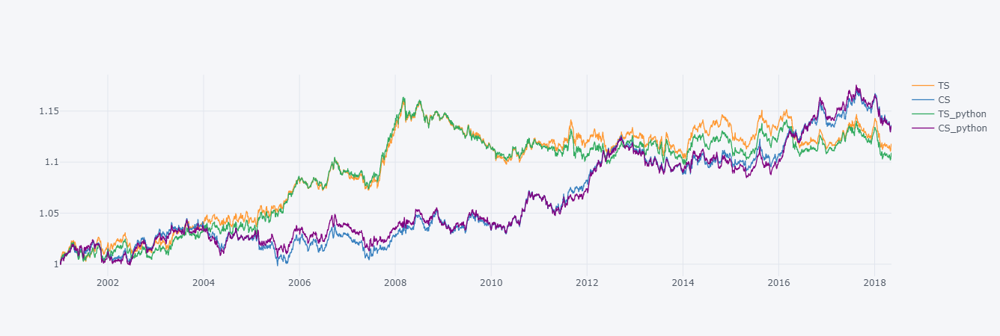

In [20]:
to_plot = (1.+ cvo_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 4. CCA3

In [21]:
cca3 = CCA3(strategy_name="CCA3", asset_type="COMMODITY")
cca3.load_index_and_return(from_db=True, save_file=True)
cca3.load_strategy_data(origin1='carry-com', origin2='carry-com2')
cca3.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)
cca3.calculate_signal(CS=0.35, nopos=0.4, minobs=60)
cca3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cca3.make_portfolio()

2020-01-21 10:10:02,257 - CCA3 - INFO - [STEP 0] START LOGGING CCA3
2020-01-21 10:10:02,259 - CCA3 - INFO - [STEP 1] LOAD DATA
2020-01-21 10:10:02,259 - CCA3 - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:10:02,259 - CCA3 - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:10:14,243 - CCA3 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:10:27,966 - CCA3 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:11:11,395 - CCA3 - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:11:41,447 - CCA3 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:11:41,448 - CCA3 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CCA3.py:45: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, an

In [22]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cca3_comp_df = pd.read_csv('./past/cca3.csv', header=0, index_col=0, parse_dates=True)
cca3_lag_comp_df = pd.read_csv('./past/cca3_lag.csv', header=0, index_col=0, parse_dates=True)

In [23]:
tester = Tester(cca3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:13:12,807 - CCA3 - INFO - [STEP 6] START BACKTEST
2020-01-21 10:13:12,808 - CCA3 - INFO - [STEP 6 - 1] BACKTEST CCA3 TIME SERIES


CCA3
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:13:21,125 - CCA3 - INFO - [STEP 6 - 2] BACKTEST CCA3 CROSS SECTIONAL


CCA3
0% [############################# ] 100% | ETA: 00:00:00

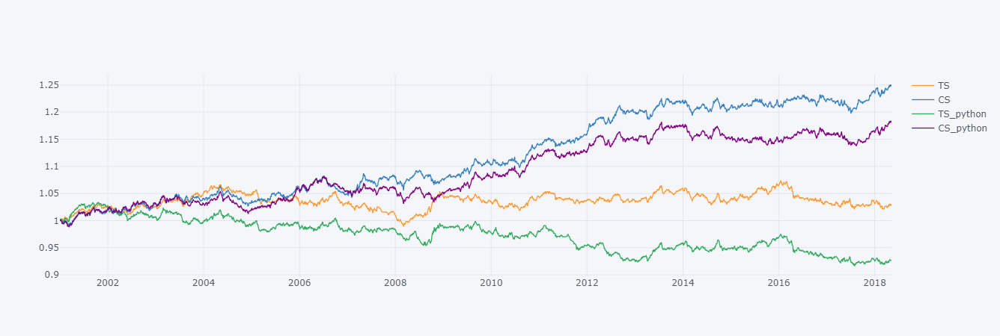

In [24]:
to_plot = (1.+ cca3_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 5. CVA3

In [25]:
cva3 = CVA3(strategy_name="CVA3", asset_type="COMMODITY")
cva3.load_index_and_return(from_db=True, save_file=True)
cva3.load_strategy_data1(table='bloom', origin='fx')
cva3.load_strategy_data2(table='past', origin='fut1price-com')
cva3.set_rebalance_period(ts_freq='month', cs_freq='month')  # rebalance_day: monday = 0, sunday = 6
cva3.calculate_signal(CS=0.35, nopos=0.4, minobs=60, minobs1=12, SMA=1, LMA=12, Lwindow=54)
cva3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva3.make_portfolio()

2020-01-21 10:13:29,238 - CVA3 - INFO - [STEP 0] START LOGGING CVA3
2020-01-21 10:13:29,239 - CVA3 - INFO - [STEP 1] LOAD DATA
2020-01-21 10:13:29,239 - CVA3 - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:13:29,240 - CVA3 - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:13:38,090 - CVA3 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:13:47,261 - CVA3 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:14:25,473 - CVA3 - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:14:43,845 - CVA3 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:14:43,845 - CVA3 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA3.py:126: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/s

In [26]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva3_comp_df = pd.read_csv('./past/cva3.csv', header=0, index_col=0, parse_dates=True)
cva3_lag_comp_df = pd.read_csv('./past/cva3_lag.csv', header=0, index_col=0, parse_dates=True)

In [27]:
tester = Tester(cva3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:16:13,449 - CVA3 - INFO - [STEP 6] START BACKTEST
2020-01-21 10:16:13,449 - CVA3 - INFO - [STEP 6 - 1] BACKTEST CVA3 TIME SERIES


CVA3
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:16:19,923 - CVA3 - INFO - [STEP 6 - 2] BACKTEST CVA3 CROSS SECTIONAL


CVA3
0% [############################# ] 100% | ETA: 00:00:00

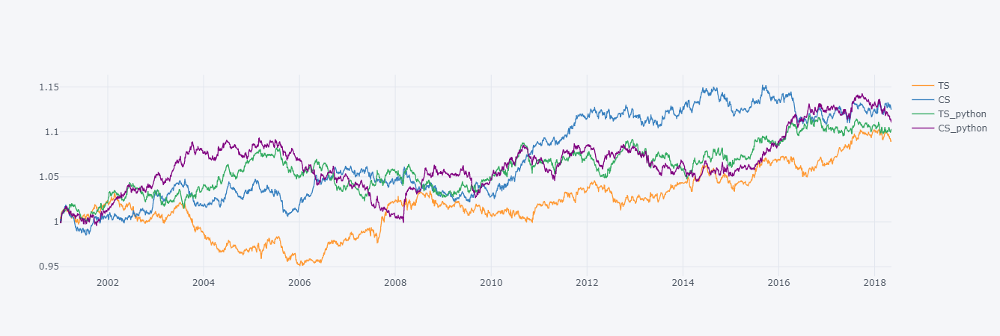

In [28]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 6. CVA2

In [29]:
cva2 = CVA2(strategy_name="CVA2", asset_type="COMMODITY")
cva2.load_index_and_return(from_db=True, save_file=True)
cva2.load_strategy_data(table='bloom', origin='commo pos')
cva2.set_rebalance_period(ts_freq='week', cs_freq='week')
cva2.calculate_signal(CS=0.35, nopos=0.4, minobs1=12)
cva2.set_portfolio_parameter(cs_strategy_type='vol')
cva2.make_portfolio()

2020-01-21 10:16:26,810 - CVA2 - INFO - [STEP 0] START LOGGING CVA2
2020-01-21 10:16:26,811 - CVA2 - INFO - [STEP 1] LOAD DATA
2020-01-21 10:16:26,811 - CVA2 - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:16:26,812 - CVA2 - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:16:35,911 - CVA2 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:16:45,970 - CVA2 - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:17:24,568 - CVA2 - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:17:29,842 - CVA2 - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:17:29,843 - CVA2 - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CVA2.py:126: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/s

In [30]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva2_comp_df = pd.read_csv('./past/cva2.csv', header=0, index_col=0, parse_dates=True)
cva2_lag_comp_df = pd.read_csv('./past/cva2_lag.csv', header=0, index_col=0, parse_dates=True)

In [31]:
tester = Tester(cva2)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:18:45,206 - CVA2 - INFO - [STEP 6] START BACKTEST
2020-01-21 10:18:45,206 - CVA2 - INFO - [STEP 6 - 1] BACKTEST CVA2 TIME SERIES


CVA2
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:18:51,300 - CVA2 - INFO - [STEP 6 - 2] BACKTEST CVA2 CROSS SECTIONAL


CVA2
0% [############################# ] 100% | ETA: 00:00:00

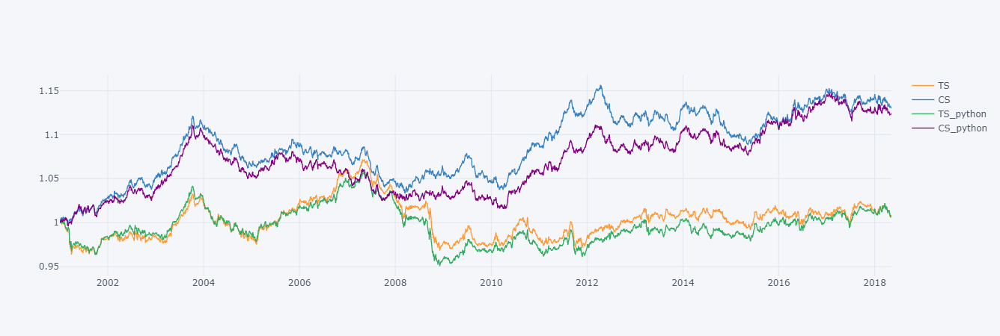

In [32]:
to_plot = (1.+ cva2_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 7. CSS

In [33]:
css = CSS(strategy_name="CSS", asset_type="COMMODITY")
css.load_index_and_return(from_db=True, save_file=True)
css.load_strategy_data1(table='bloom', origin1='fx', origin2='carry-com', origin3='carry-com2')
css.load_strategy_data2(table='past', origin='seasonal')
css.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
css.calculate_signal(CS=0.35)
css.set_portfolio_parameter(cs_strategy_type='vol')
css.make_portfolio()

2020-01-21 10:18:58,824 - CSS - INFO - [STEP 0] START LOGGING CSS
2020-01-21 10:18:58,825 - CSS - INFO - [STEP 1] LOAD DATA
2020-01-21 10:18:58,825 - CSS - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-21 10:18:58,826 - CSS - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-21 10:19:13,242 - CSS - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:19:27,801 - CSS - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-21 10:20:12,044 - CSS - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT
2020-01-21 10:21:03,952 - CSS - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-21 10:21:03,953 - CSS - INFO - [STEP 3] CACULATE SIGNAL
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CSS.py:101: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_

In [34]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
css_comp_df = pd.read_csv('./past/css.csv', header=0, index_col=0, parse_dates=True)
css_lag_comp_df = pd.read_csv('./past/css_lag.csv', header=0, index_col=0, parse_dates=True)

In [35]:
tester = Tester(css)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-21 10:22:24,501 - CSS - INFO - [STEP 6] START BACKTEST
2020-01-21 10:22:24,501 - CSS - INFO - [STEP 6 - 1] BACKTEST CSS TIME SERIES


CSS
0% [############################# ] 100% | ETA: 00:00:00

2020-01-21 10:22:30,959 - CSS - INFO - [STEP 6 - 2] BACKTEST CSS CROSS SECTIONAL


CSS
0% [############################# ] 100% | ETA: 00:00:00

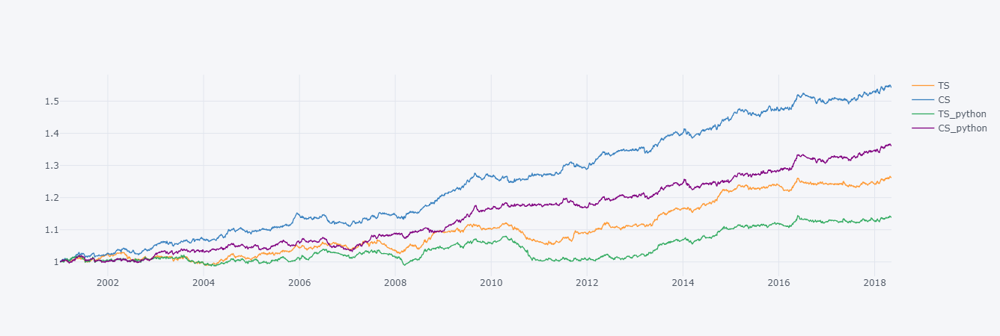

In [36]:
to_plot = (1.+ css_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()